In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [ ]:
import numpy as np
import cv2 as cv
import glob
from google.colab.patches import cv_imshow

In [ ]:
img = cv.imread('/content/gdrive/MyDrive/MachineVision/as/cat1.png')

NameError: ignored

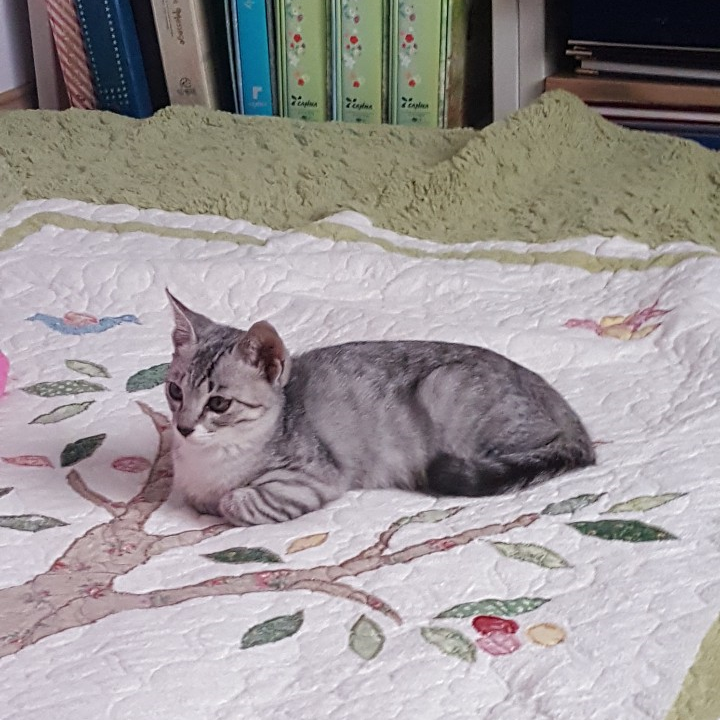

In [ ]:
cv_imshow(img)

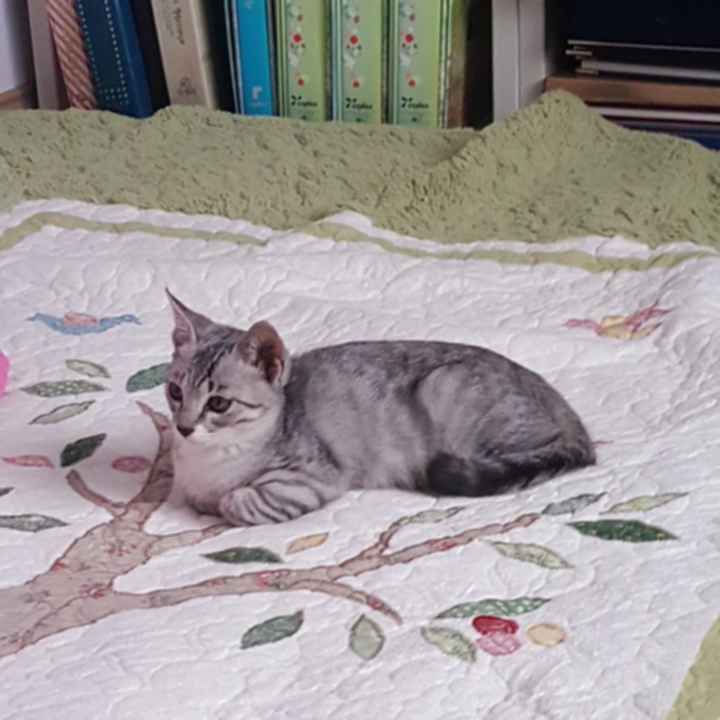

In [ ]:
avgf3=cv.blur(img, ksize=(3,3))
cv_imshow(avgf3)

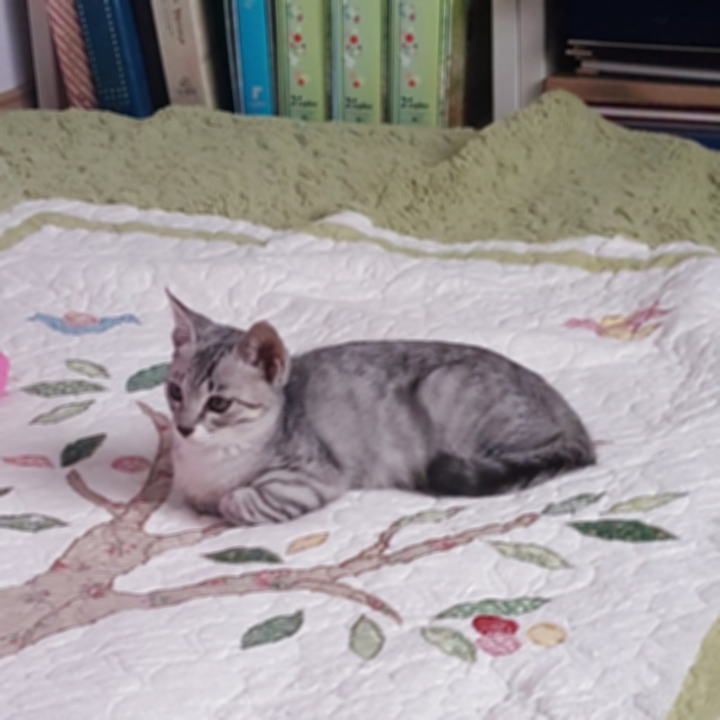

In [ ]:
avgf5=cv.blur(img, ksize=(5,5))
cv_imshow(avgf5)

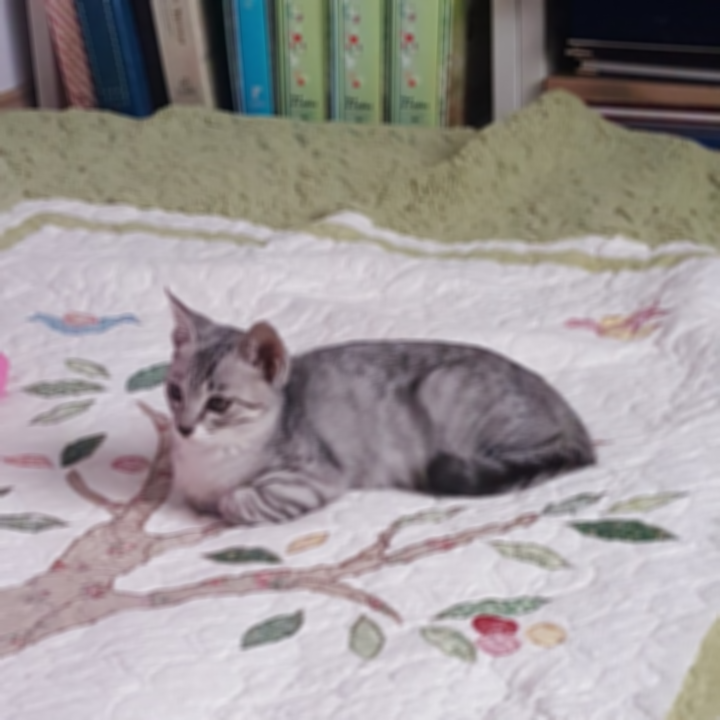

In [ ]:
avgf7=cv.blur(img, ksize=(7,7))
cv_imshow(avgf7)

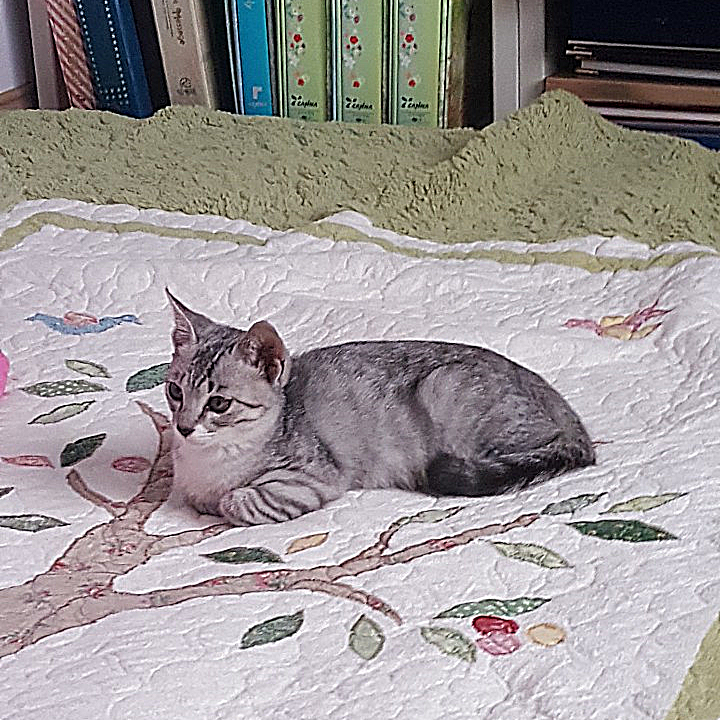

In [ ]:
blur = cv.blur(img, ksize=(5,5))
detail = np.int32(img) - np.int32(blur)
shapened_img2 = np.int32(img) + 2*detail
cv_imshow(shapened_img2)

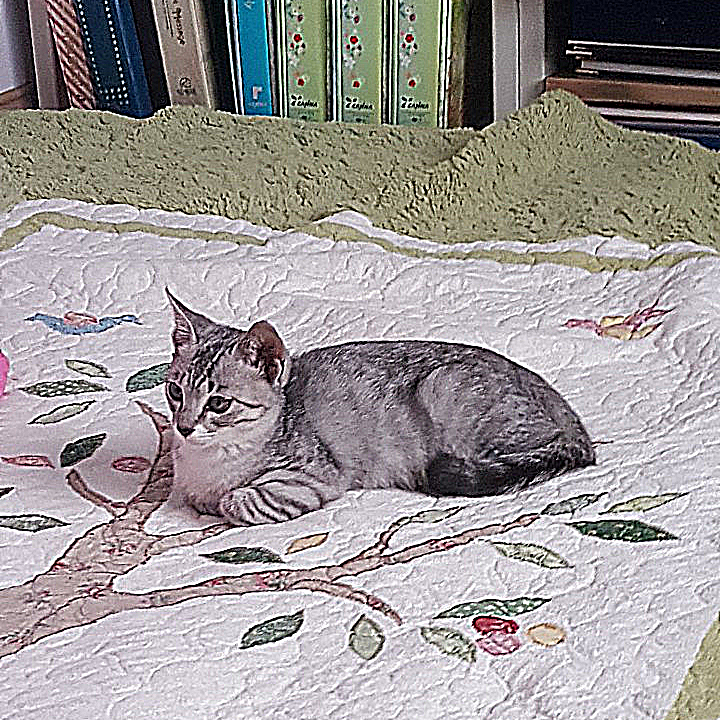

In [ ]:
shapened_img5 = np.int32(img) + 5*detail
cv_imshow(shapened_img5)

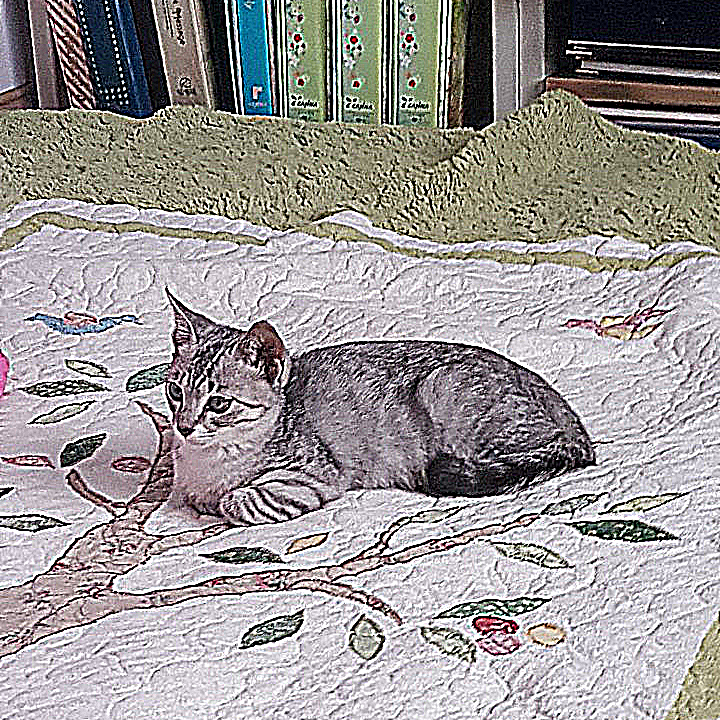

In [ ]:
shapened_img10 = np.int32(img) + 10*detail
cv_imshow(shapened_img10)

In [ ]:
##1) 𝜎가 2이고 길이가 7인 1D Gaussian filter를 만들어 이름을 kernel1d로 설정하세요.
kernel1d	=	cv.getGaussianKernel(7, 2)
print(kernel1d)

[[0.07015933]
 [0.13107488]
 [0.19071282]
 [0.21610594]
 [0.19071282]
 [0.13107488]
 [0.07015933]]


In [ ]:
##2) 아래 코드로 kernel1d의 outer product를 계산하여 2D Gaussian filter인 kernel2d를 만드세요.
kernel2d = np.outer(kernel1d, kernel1d.transpose())
print(kernel2d)

[[0.00492233 0.00919613 0.01338028 0.01516185 0.01338028 0.00919613
  0.00492233]
 [0.00919613 0.01718062 0.02499766 0.02832606 0.02499766 0.01718062
  0.00919613]
 [0.01338028 0.02499766 0.03637138 0.04121417 0.03637138 0.02499766
  0.01338028]
 [0.01516185 0.02832606 0.04121417 0.04670178 0.04121417 0.02832606
  0.01516185]
 [0.01338028 0.02499766 0.03637138 0.04121417 0.03637138 0.02499766
  0.01338028]
 [0.00919613 0.01718062 0.02499766 0.02832606 0.02499766 0.01718062
  0.00919613]
 [0.00492233 0.00919613 0.01338028 0.01516185 0.01338028 0.00919613
  0.00492233]]


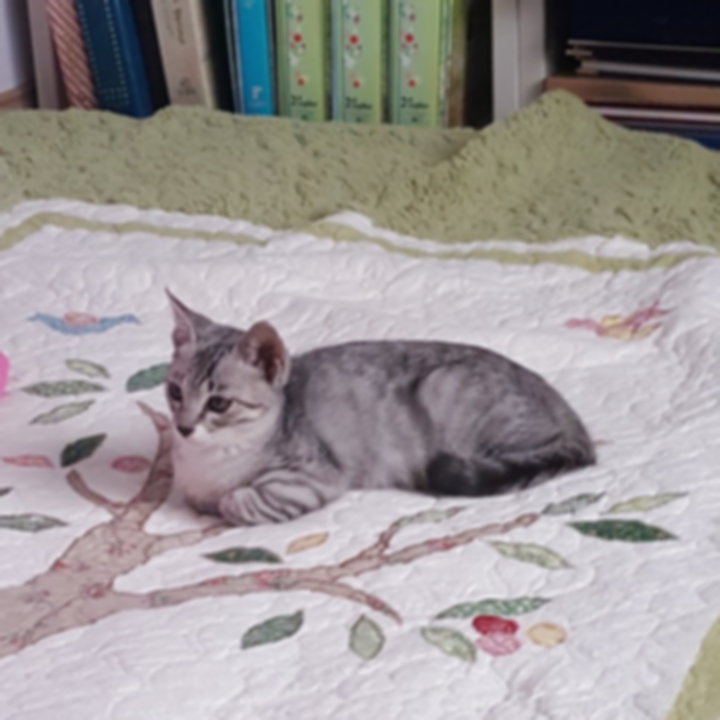

In [ ]:
##3) 입력 영상을 kernel2d를 사용하여 filtering하세요.
imgg1=cv.filter2D(img,-1,kernel2d)
cv_imshow(imgg1)

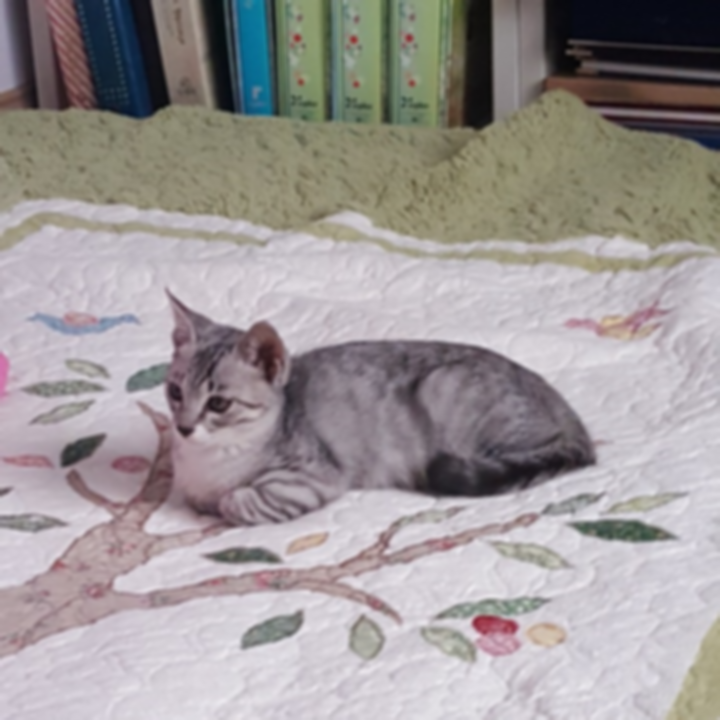

In [ ]:
##4)입력 영상을 kernel1d를 적용한 후 그 결과에 다시 kernel1d.transpose()를 적용하여 separable filtering을 수행하세요.
imgg2=cv.filter2D(cv.filter2D(img,-1,kernel1d),-1,kernel1d.transpose())
cv_imshow(imgg2)

In [ ]:
imgg2=cv.filter2D(cv.filter2D(img,-1,kernel1d),-1,kernel1d.transpose())
cv_imshow(imgg2)

In [ ]:
print(imgg2-imgg1)

[[[  0   0   0]
  [  0   0   1]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [255   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [255   0   0]
  ...
  [  0   0   0]
  [  0   0   1]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]


In [ ]:
print(imgg2-imggtmp)

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]


In [ ]:
def addsaltandpeppernoise(image,ratio):
  row,col,ch = image.shape
  out = np.copy(image)
  # Salt mode
  num_salt = np.ceil(image.size * ratio)
  coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
  out[coords] = 255
  # Pepper mode
  num_pepper = np.ceil(image.size * ratio)
  coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
  out[coords] = 0
  return out
imgsp002 = addsaltandpeppernoise(img, ratio=0.02)
imgsp01 = addsaltandpeppernoise(img, ratio=0.1)
imgsp025 = addsaltandpeppernoise(img, ratio=0.25)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  # This is added back by InteractiveShellApp.init_path()


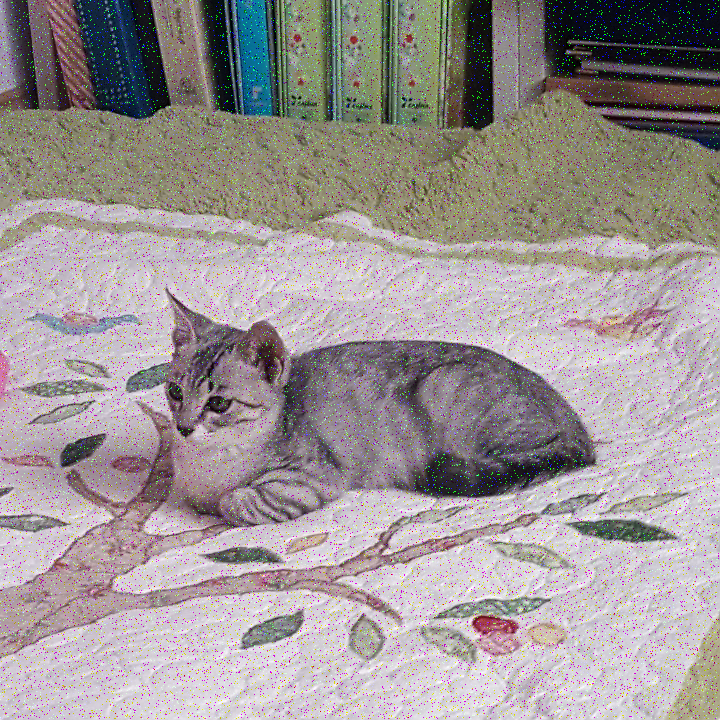

In [ ]:
cv_imshow(imgsp002)

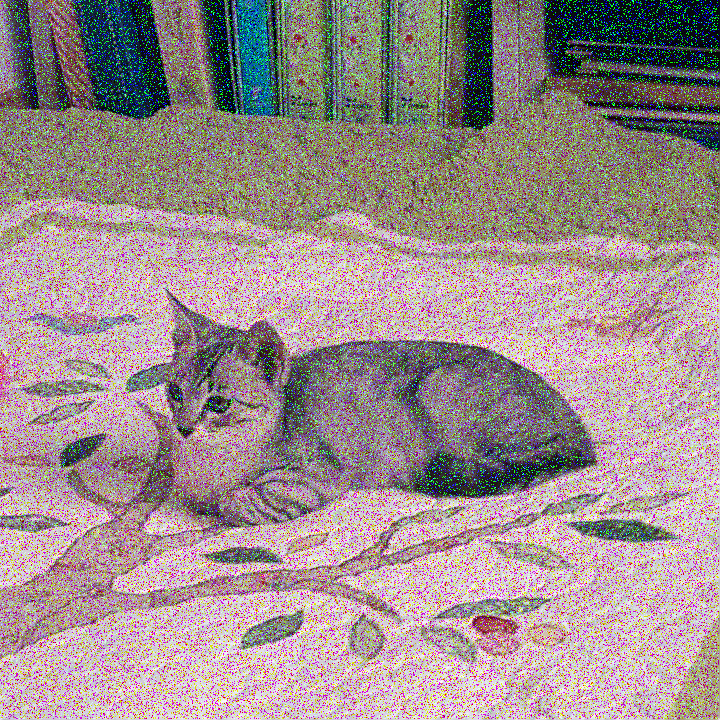

In [ ]:
cv_imshow(imgsp01)

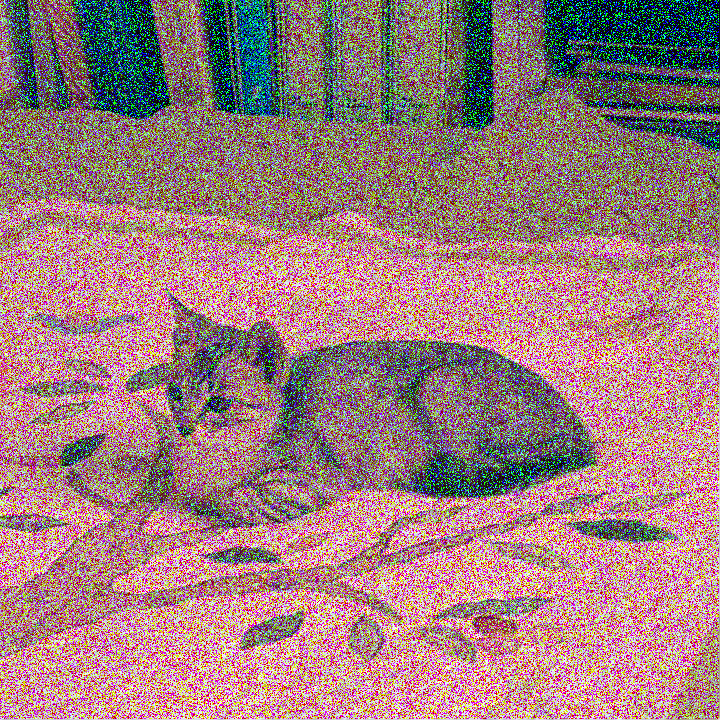

In [ ]:
cv_imshow(imgsp025)

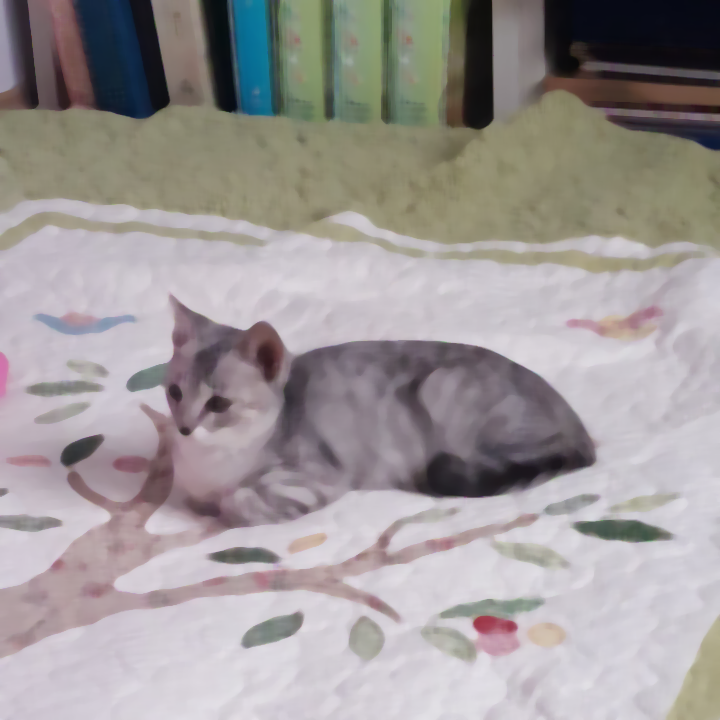

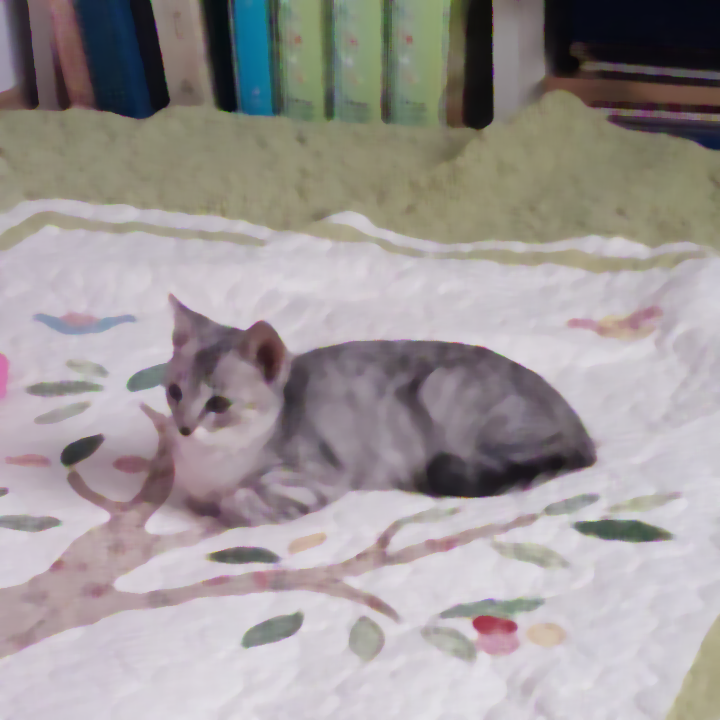

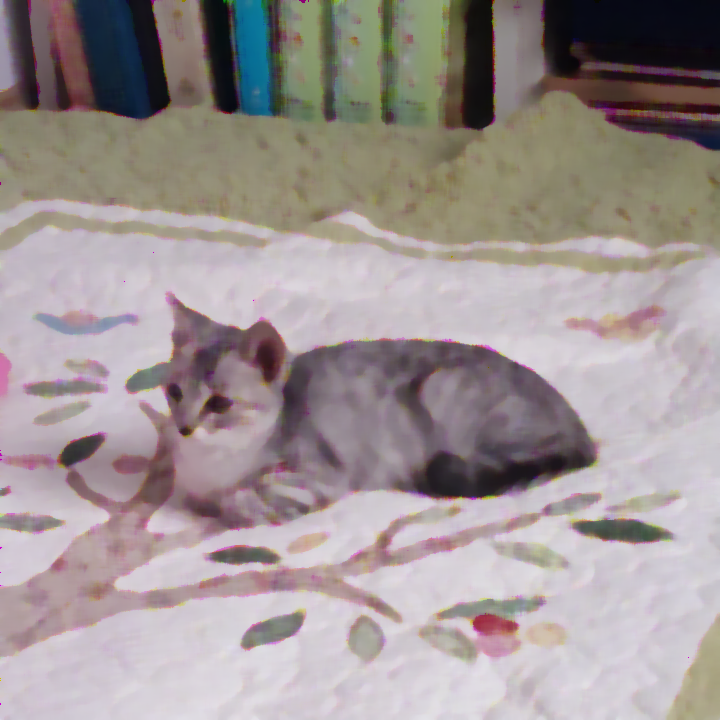

In [ ]:
img002mid3 = cv.medianBlur(imgsp002, ksize=11)
img01mid3 = cv.medianBlur(imgsp01, ksize=11)
img025mid3 = cv.medianBlur(imgsp025, ksize=11)
cv_imshow(img002mid3)
cv_imshow(img01mid3)
cv_imshow(img025mid3)

In [ ]:
blur1=cv.GaussianBlur(img,ksize=(7,7),sigmaX=3)
blur2=cv.GaussianBlur(img,ksize=(11,11),sigmaX=5)

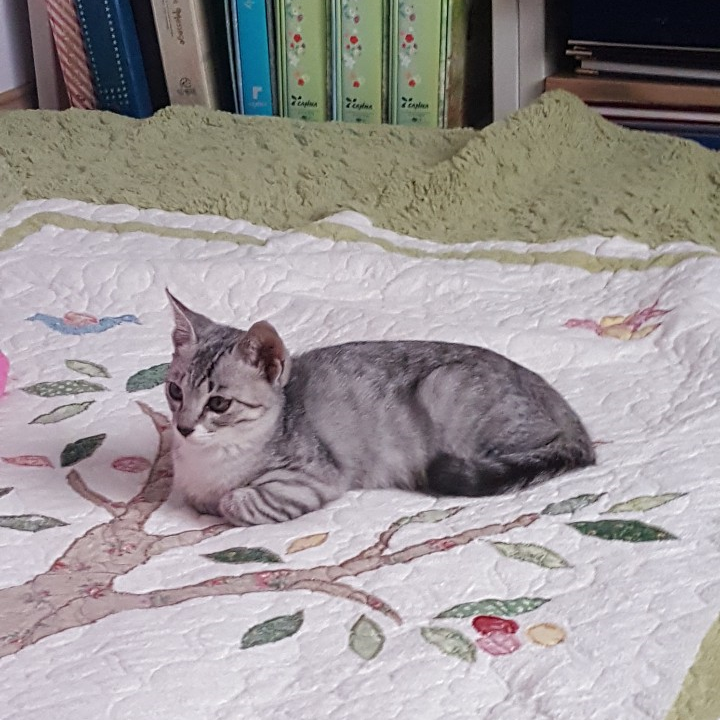

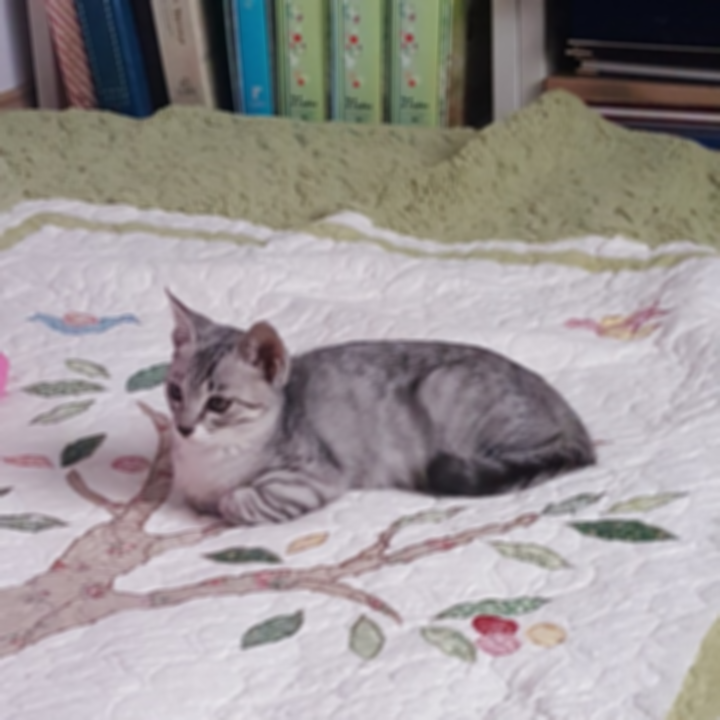

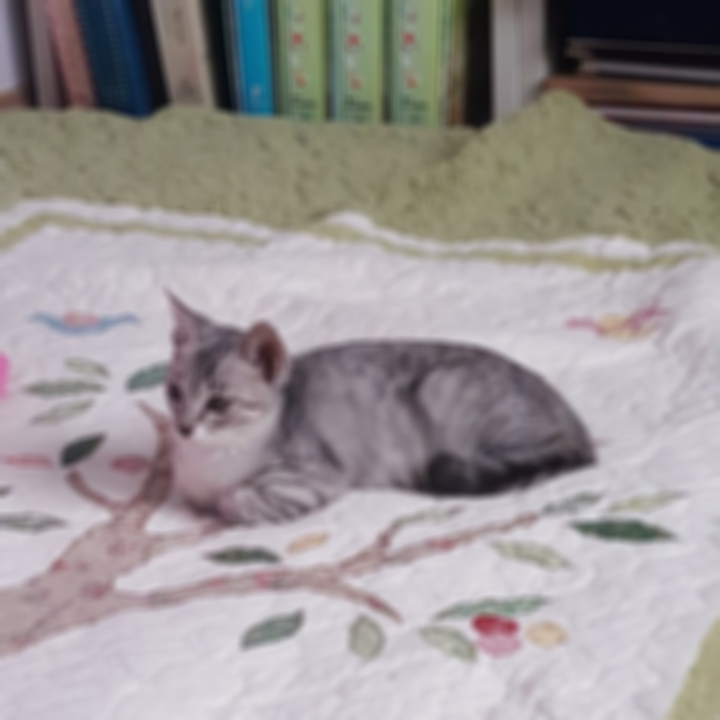

In [ ]:
cv_imshow(img)
cv_imshow(blur1)
cv_imshow(blur2)